### Horses to Zebras.

In this notebook we will copy the `unet_model` from [tensorflow examples](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py#L206) pix2pix and see what are we going to get as predictions after training for `10` epochs.

We are doing this just to compare my previous notebook results with this notebook results. Loading the data will remain the same we are only going to modify few things.

## Imports

In [43]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras

import os, time
import matplotlib.pyplot as plt
import numpy as np

from prettytable import PrettyTable

AUTOTUNE = tf.data.AUTOTUNE

tf.__version__

'2.5.0'

### Input pipeline

We are going to preprocess our input by doing the following:

* random jittering, the image is resized to `286 x 286` and then randomly cropped to `256 x 256`.
* random mirroring, the image is randomly flipped horizontally i.e left to right.
* We are going to normalize the image so that each pixel value will be in range `[-1, 1]`.

In [ ]:
dataset, metadata = tfds.load(
    'cycle_gan/horse2zebra',
    with_info=True,
    as_supervised=True
)

train_horses, train_zebras = dataset['trainA'], dataset['trainB']
test_horses, test_zebras = dataset['testA'], dataset['testB']

### Hyperparams

In [3]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

### Random cropping

In [4]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3]
  )
  return cropped_image

### Normalizing images Function

In [5]:
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

### Random `jittering` function

In [6]:
@tf.function
def random_jitter(image):
  image = tf.image.resize(image,[286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
                          )
  image = random_crop(image)
  image = tf.image.random_flip_left_right(image)
  return image


Creating functions that will load the train and test sets. 

**Note:** Only random jittering is applied on the train set only not on the test set. On the test set we are only going to nomilize the images.

In [7]:
def process_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def process_image_test(image, label):
  return normalize(image)

### Datasets

In [8]:
train_horses = train_horses.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_zebras = train_zebras.cache().map(
    process_image_train, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_horses = test_horses.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

test_zebras = test_zebras.cache().map(
    process_image_test, num_parallel_calls=AUTOTUNE
).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Counting examples

In [9]:
colums_data = "SUBSET", "EXAMPLE(s)"
rows_data = [
             ["training(horses)", f'{len(train_horses):,}'], 
             ["training(zebras)", f'{len(train_zebras):,}'],
             ["testing(horses)", f'{len(test_horses):,}'], 
             ["testing(zebras)", f'{len(test_zebras):,}'],
  ]
title = "TOTAL EXAMPLES FOR ALL SUBSETS"
def tabulate_example(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)
tabulate_example(colums_data, rows_data, title)

+---------------------------------+
|  TOTAL EXAMPLES FOR ALL SUBSETS |
+-------------------+-------------+
| SUBSET            |  EXAMPLE(s) |
+-------------------+-------------+
| training(horses)  |       1,067 |
| training(zebras)  |       1,334 |
| testing(horses)   |         120 |
| testing(zebras)   |         140 |
+-------------------+-------------+


### Ploting samples.

In [10]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

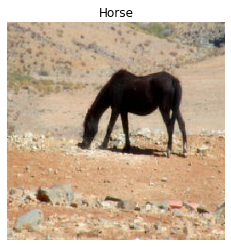

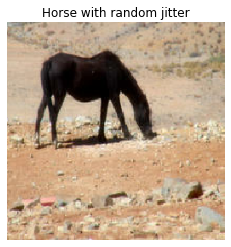

In [11]:
plt.imshow(sample_horse[0] * 0.5 + 0.5, cmap="gray")
plt.title("Horse")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Horse with random jitter")
plt.axis('off')
plt.show()

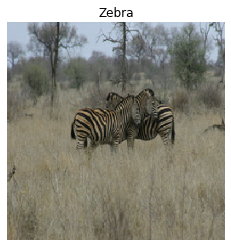

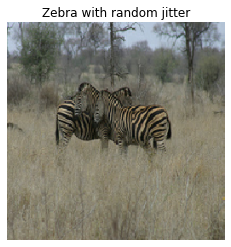

In [12]:
plt.imshow(sample_zebra[0] * 0.5 + 0.5, cmap="gray")
plt.title("Zebra")
plt.axis('off')
plt.show()

plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5, cmap="gray")
plt.title("Zebra with random jitter")
plt.axis('off')
plt.show()

### Next.

In this section we will implement the `pix2pix` unet model based on this [code](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py)


**Instead of importing the `pix2pix` model achitecture from [tensorflow examples](https://github.com/tensorflow/examples) We are going to build our models from skretch.**

The model architecture used in this notebook is very similar to what was used in [pix2pix](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py). Some of the differences are:

* Cyclegan uses [instance normalization](https://arxiv.org/abs/1607.08022) instead of [batch normalization](https://arxiv.org/abs/1502.03167).

* The [CycleGAN](https://arxiv.org/abs/1703.10593) paper uses a modified resnet based generator. This notebook is using a modified unet generator for simplicity.
There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here.

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

![Cyclegan model](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/cyclegan_model.png?raw=1)


### Instace Normalization.
First we will create an ``InstanceNormalization``Layer from this [paper](https://arxiv.org/abs/1607.08022).

In [13]:
class InstanceNormalization(keras.layers.Layer):
  def __init__(self, epsilon=1e-5):
    super(InstanceNormalization, self).__init__()
    self.epsilon = epsilon

  def build(self, input_shape):
    self.scale = self.add_weight(
        name="scale",
        shape=input_shape[-1:],
        initializer=tf.random_normal_initializer(1., 0.02),
        trainable = True
    )
    self.offset = self.add_weight(
        name="offset",
        shape=input_shape[-1:],
        initializer = "zeros",
        trainable = True
    )
  
  def call(self, x):
    mean, variance = tf.nn.moments(
        x, axes=[1, 2], keepdims=True
    )
    inv = tf.math.rsqrt(variance + self.epsilon)
    normalized = (x - mean) * inv
    return self.scale * normalized + self.offset


### Encoder, (downsample)

Instead of using the class method that we used previously. In this notebook we are going to use  functions to make it very simple. Also the functions this time around will return a `keras.Sequential` model instead of a `keras.Layer`

```py
[ Conv2D ] => [ Batchnorm ] => [ LeakyRelu ]
```

Args:

```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_norm: If True, adds the batchnorm layer
```

Return:
```
downsample keras model
```

In [14]:
def downsample(filters, size, norm_type='batchnorm', apply_norm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_norm:
    if norm_type.lower() == 'batchnorm':
      result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
      result.add(InstanceNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [15]:
test_image = tf.random.normal([256, 256, 3])

In [16]:
down_model = downsample(3, 4)
down_sampled = down_model(tf.expand_dims(test_image, 0))
down_sampled.shape

TensorShape([1, 128, 128, 3])

### Decoder (downsampler).

Again in the `decoder` we are going to use functions instead of classes:

```
[ Conv2DTranspose ] => [ Batchnorm ] => [ Dropout ] => [ ReLu ]
```

Args:
```
  Args:
    filters: number of filters
    size: filter size
    norm_type: Normalization type; either 'batchnorm' or 'instancenorm'.
    apply_dropout: If True, adds the dropout layer
```

Returns:
```
Returns:
    upsample keras sequential model
```



In [17]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

  if norm_type.lower() == 'batchnorm':
    result.add(tf.keras.layers.BatchNormalization())
  elif norm_type.lower() == 'instancenorm':
    result.add(InstanceNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result


In [18]:
upsampler_model = upsample(3, 4)
up_sampled = upsampler_model(down_sampled)
up_sampled.shape

TensorShape([1, 256, 256, 3])

### The ``discriminator`` model.

We are going to us the [PatchGan](https://arxiv.org/abs/1611.07004) discriminator. which take the following args:

```
Args:
    norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
    target: Bool, indicating whether target image is an input or not.
```
and returns:

```
Returns:
  Discriminator model
```


In [19]:
def discriminator(norm_type='batchnorm', target=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
  x = inp

  if target:
    tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')
    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, norm_type, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4, norm_type)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4, norm_type)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(
      512, 4, strides=1, kernel_initializer=initializer,
      use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  if norm_type.lower() == 'batchnorm':
    norm1 = tf.keras.layers.BatchNormalization()(conv)
  elif norm_type.lower() == 'instancenorm':
    norm1 = InstanceNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(
      1, 4, strides=1,
      kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  if target:
    return tf.keras.Model(inputs=[inp, tar], outputs=last)
  else:
    return tf.keras.Model(inputs=inp, outputs=last)

In [20]:
discriminator().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, None, None,  0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, None, None,  0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, None, None, 6 0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, None, None, 6 6144        concatenate[0][0]            

### Plotiing the discriminator model.

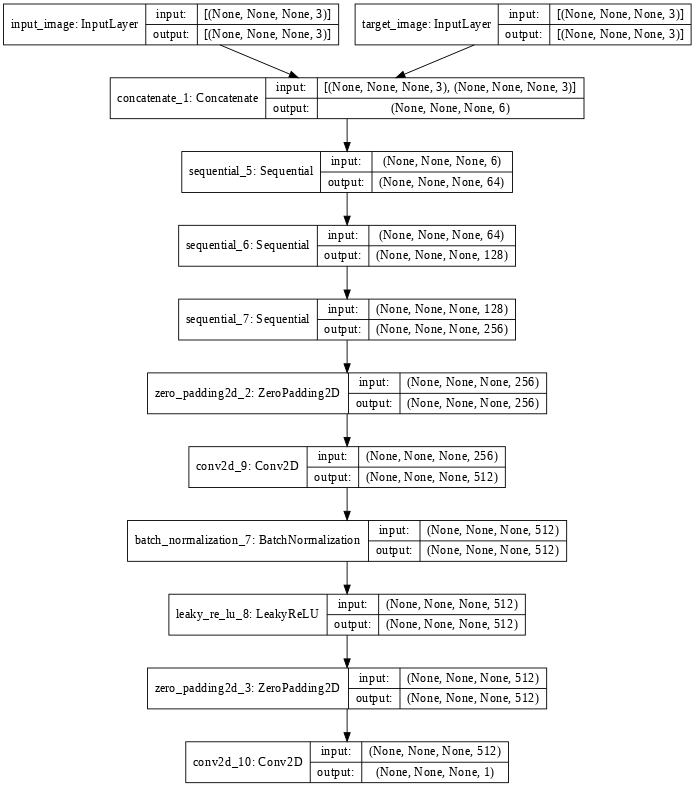

In [21]:
keras.utils.plot_model(discriminator(), show_shapes=True, dpi=64)

### The ``generator`` model.

We are going to create a modeified version of the `unet_generator` based on [this paper](https://arxiv.org/abs/1611.07004) which takes the following args.

Args:
```
Args:
  output_channels: Output channels
  norm_type: Type of normalization. Either 'batchnorm' or 'instancenorm'.
```

Return:
```
  Returns:
    Generator model
```

This generator model is absolutely the same as the one we used in the `pix2pix` series.

In [22]:
def unet_generator(output_channels, norm_type='batchnorm'):
  down_stack = [
      downsample(64, 4, norm_type, apply_norm=False),  # (bs, 128, 128, 64)
      downsample(128, 4, norm_type),  # (bs, 64, 64, 128)
      downsample(256, 4, norm_type),  # (bs, 32, 32, 256)
      downsample(512, 4, norm_type),  # (bs, 16, 16, 512)
      downsample(512, 4, norm_type),  # (bs, 8, 8, 512)
      downsample(512, 4, norm_type),  # (bs, 4, 4, 512)
      downsample(512, 4, norm_type),  # (bs, 2, 2, 512)
      downsample(512, 4, norm_type),  # (bs, 1, 1, 512)
  ]

  up_stack = [
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 2, 2, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 4, 4, 1024)
      upsample(512, 4, norm_type, apply_dropout=True),  # (bs, 8, 8, 1024)
      upsample(512, 4, norm_type),  # (bs, 16, 16, 1024)
      upsample(256, 4, norm_type),  # (bs, 32, 32, 512)
      upsample(128, 4, norm_type),  # (bs, 64, 64, 256)
      upsample(64, 4, norm_type),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 4, strides=2,
      padding='same', kernel_initializer=initializer,
      activation='tanh')  # (bs, 256, 256, 3)

  concat = tf.keras.layers.Concatenate()

  inputs = tf.keras.layers.Input(shape=[None, None, 3])
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concat([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

### Plotting the model.


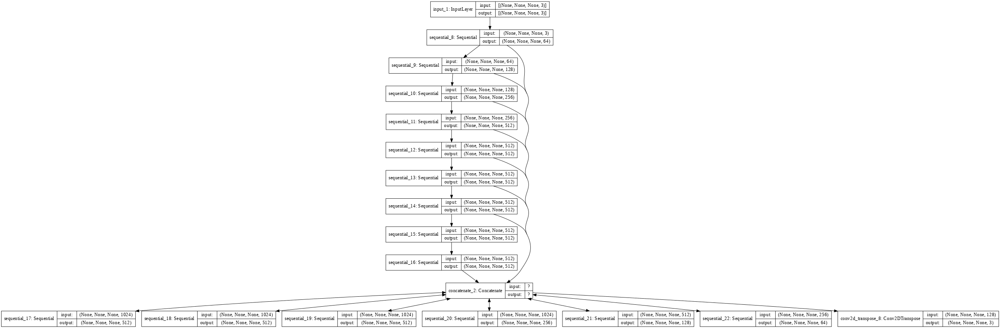

In [23]:
keras.utils.plot_model(unet_generator(3), show_shapes=True, dpi=64)

### Creating instances of generators and discriminators

In [24]:
OUTPUT_CHANNELS = 3

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

In [25]:
generator_f.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
sequential_38 (Sequential)      (None, None, None, 6 3072        input_3[0][0]                    
__________________________________________________________________________________________________
sequential_39 (Sequential)      (None, None, None, 1 131328      sequential_38[0][0]              
__________________________________________________________________________________________________
sequential_40 (Sequential)      (None, None, None, 2 524800      sequential_39[0][0]              
____________________________________________________________________________________________

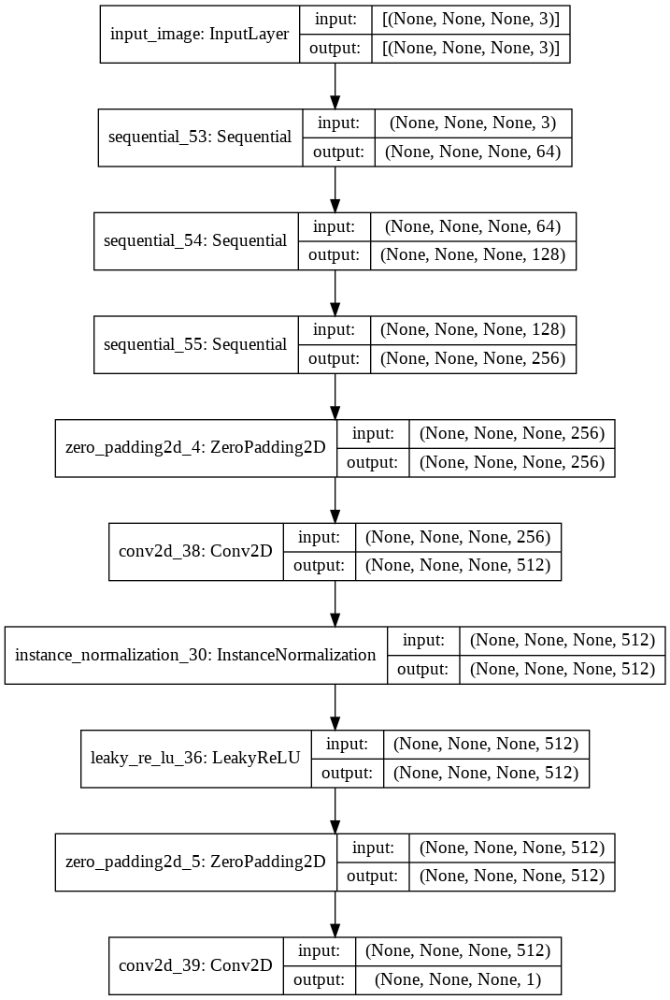

In [26]:
tf.keras.utils.plot_model(discriminator_x, show_shapes=True)

### Testing the generators

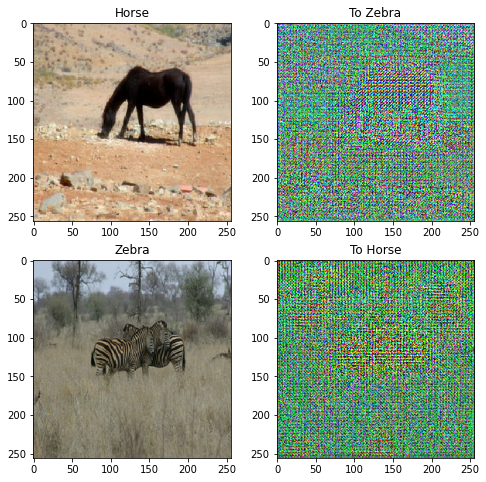

In [27]:
to_zebra = generator_g(sample_horse)
to_horse = generator_f(sample_zebra)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

### Testing the generator

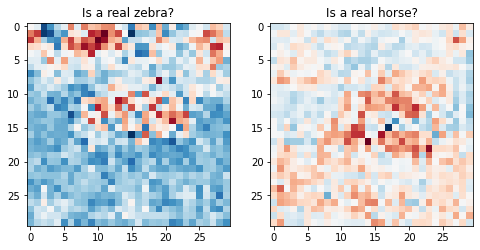

In [28]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real zebra?')
plt.imshow(discriminator_y(sample_zebra)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real horse?')
plt.imshow(discriminator_x(sample_horse)[0, ..., -1], cmap='RdBu_r')

plt.show()

### Loss functions

In [29]:
LAMBDA = 10
criterion = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = criterion(tf.ones_like(real), real)
  generated_loss = criterion(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss * .5

def generator_loss(generated):
  return criterion(tf.ones_like(generated), generated)

### Cycled loss

In [30]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  return LAMBDA * loss1

### Identity loss

In [31]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * .5 * loss

### Optimizers

In [32]:
generator_g_optimizer = generator_f_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

discriminator_x_optimizer = discriminator_y_optimizer = tf.keras.optimizers.Adam(
    2e-4, beta_1 = .5
)

### Checkpoints

In [33]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')
  

### Training 

We are going to train for fewer epochs but feel free to train for more epochs to get reasonable results.

In [34]:
EPOCHS = 10

### Plot generated images

In [35]:
def generated_images(model, test_input):
  prediction = model(test_input)
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

### Train step

In [36]:
@tf.function
def train_step(real_x, real_y):
  """
  persistent is set to True because the tape is used more than once to calculate the gradients.
  """
  with tf.GradientTape(persistent=True) as tape:
    """
    Generator G translates X -> Y
    Generator F translates Y -> X.
    """
    fake_y = generator_g(real_x, training=True)
    cycled_y = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_x = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    """
    calculate the losses.
    """
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients of the generator and discriminator
  gradients_of_generator_g = tape.gradient(total_gen_g_loss,
                                           generator_g.trainable_variables
                                           )
  gradients_of_generator_f = tape.gradient(total_gen_f_loss,
                                           generator_f.trainable_variables
                                           )
  gradients_of_discriminator_x = tape.gradient(
      disc_x_loss,
      discriminator_x.trainable_variables
  )
  gradients_of_discriminator_y = tape.gradient(
      disc_y_loss,
      discriminator_y.trainable_variables
  )

  # Update the weights by applying the gradients.

  generator_g_optimizer.apply_gradients(
      zip(gradients_of_generator_g, generator_g.trainable_variables)
  )
  generator_f_optimizer.apply_gradients(
      zip(gradients_of_generator_f, generator_f.trainable_variables)
  )
  discriminator_x_optimizer.apply_gradients(
      zip(gradients_of_discriminator_x, discriminator_x.trainable_variables)
  )
  discriminator_y_optimizer.apply_gradients(
      zip(gradients_of_discriminator_y, discriminator_y.trainable_variables)
  )

  return gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss
  

### Helper functions

1. time to string

In [37]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

### tabulate training epoch

In [38]:
def tabulate_training_epochs(column_names, data, title):
  table = PrettyTable(column_names)
  table.title= title
  table.align[column_names[0]] = 'l'
  table.align[column_names[1]] = 'r'
  table.align[column_names[2]] = 'r'
  table.align[column_names[3]] = 'r'
  table.align[column_names[4]] = 'r'
  table.align[column_names[5]] = 'r'
  for row in data:
    table.add_row(row)
  print(table)

3. `.fit()`

In [39]:
def fit(train_horses, train_zebras, epochs):
  columns_data =["EPOCH", "ETA", "GEN_G_LOSS", "GEN_F_LOSS", "DISC_X_LOSS","DISC_Y_LOSS"]
  print("Training start....")
  for epoch in range (epochs):
    start = time.time()
    n = 0
    gen_g_loss, gen_f_loss, disc_x_loss, disc_y_loss = 0, 0, 0, 0
    for image_x, image_y in tf.data.Dataset.zip((train_horses, train_zebras)):
      g_loss, f_loss, x_loss, y_loss = train_step(image_x, image_y)

      gen_g_loss +=g_loss
      gen_f_loss += f_loss
      disc_x_loss += x_loss
      disc_y_loss += y_loss
      n += 1
    end = time.time()
    if (epoch + 1) % 10 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                            ckpt_save_path))
    rows_data = [
       [epoch+1, hms_string(end - start),
        f'{(gen_g_loss/n):.3f}',
        f'{(gen_f_loss/n):.3f}',
        f'{(disc_x_loss/n):.3f}',
        f'{(disc_y_loss/n):.3f}'
        ],      
    ]
    title = f'EPOCH:  {epoch+1:02}/{epochs} {"display" if epoch == 0 or (epoch+1)%10 == 0 else "no display"}'
    if epoch == 0 or (epoch+1) % 2 == 0:
      # Using a consistent image (sample_horse) so that the progress of the model is clearly visible.
      generated_images(generator_g, sample_horse)
    tabulate_training_epochs(columns_data, rows_data, title)
    

### Running the training loop.

Training start....


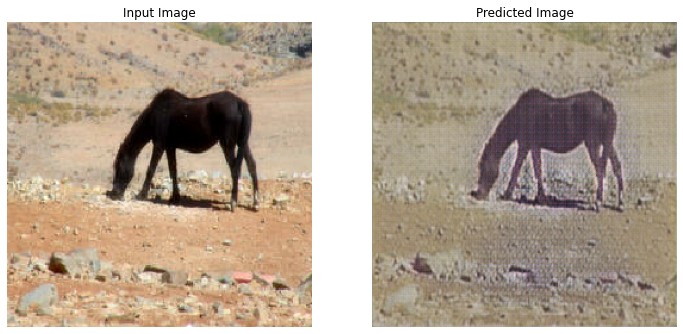

+--------------------------------------------------------------------------+
|                          EPOCH:  01/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 1     | 0:14:50.68 |      0.803 |      0.818 |       0.686 |       0.688 |
+-------+------------+------------+------------+-------------+-------------+


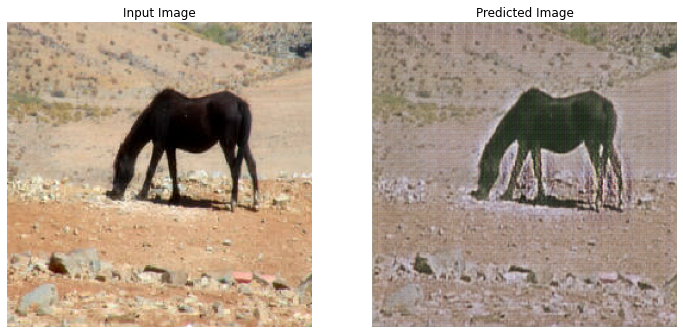

+--------------------------------------------------------------------------+
|                         EPOCH:  02/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 2     | 0:14:21.15 |      0.966 |      0.826 |       0.667 |       0.609 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  03/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 3     | 0:14:20.28 |      1.415 |      0.867 |       0.649 |       0.476 |

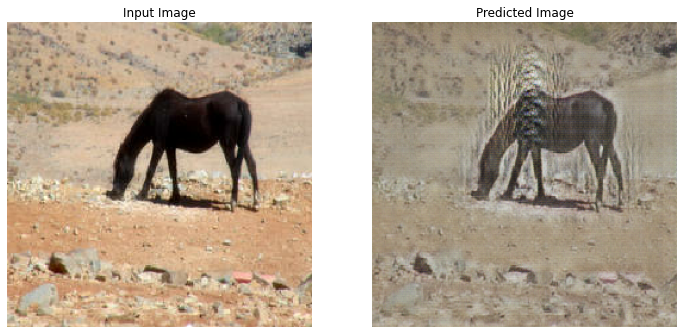

+--------------------------------------------------------------------------+
|                         EPOCH:  04/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 4     | 0:14:21.59 |      1.517 |      0.902 |       0.638 |       0.451 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  05/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 5     | 0:14:21.65 |      1.471 |      0.987 |       0.611 |       0.468 |

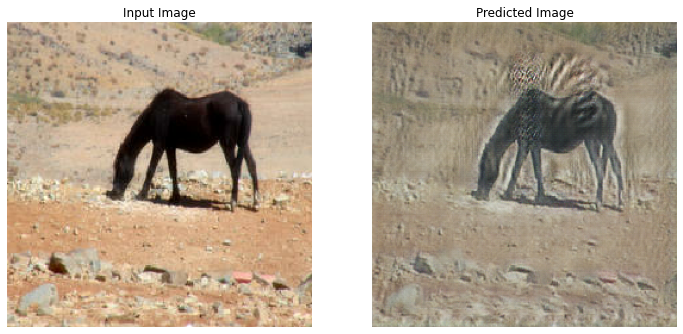

+--------------------------------------------------------------------------+
|                         EPOCH:  06/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 6     | 0:14:21.78 |      1.567 |      1.088 |       0.586 |       0.438 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  07/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 7     | 0:14:23.43 |      1.513 |      0.846 |       0.653 |       0.467 |

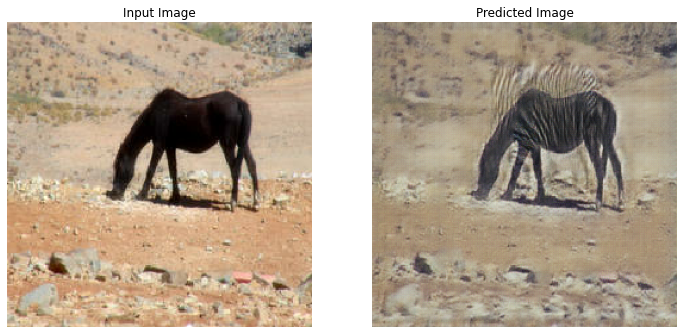

+--------------------------------------------------------------------------+
|                         EPOCH:  08/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 8     | 0:14:24.07 |      1.544 |      0.993 |       0.610 |       0.450 |
+-------+------------+------------+------------+-------------+-------------+
+--------------------------------------------------------------------------+
|                         EPOCH:  09/10 no display                         |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 9     | 0:14:22.57 |      1.459 |      1.014 |       0.605 |       0.463 |

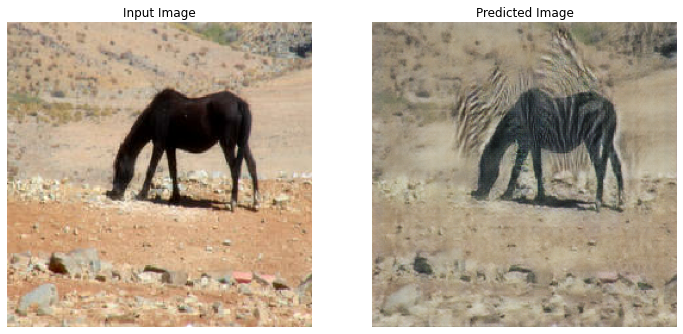

+--------------------------------------------------------------------------+
|                          EPOCH:  10/10 display                           |
+-------+------------+------------+------------+-------------+-------------+
| EPOCH |        ETA | GEN_G_LOSS | GEN_F_LOSS | DISC_X_LOSS | DISC_Y_LOSS |
+-------+------------+------------+------------+-------------+-------------+
| 10    | 0:14:23.69 |      1.491 |      1.147 |       0.565 |       0.458 |
+-------+------------+------------+------------+-------------+-------------+


In [40]:
fit(train_horses, train_zebras, EPOCHS)

### Generaing images from the `train_set`

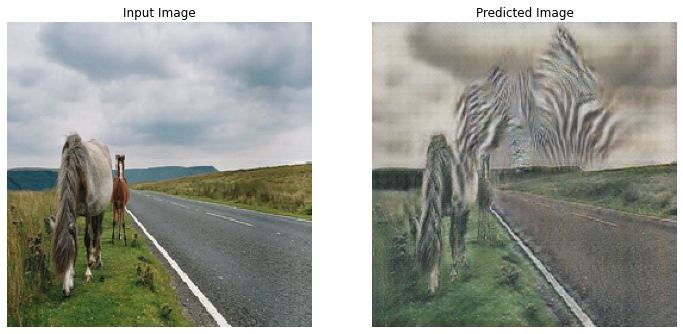

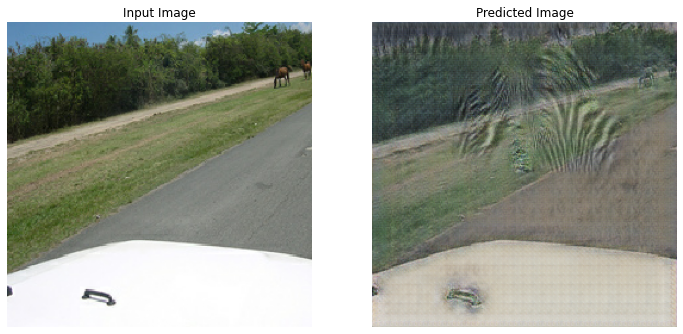

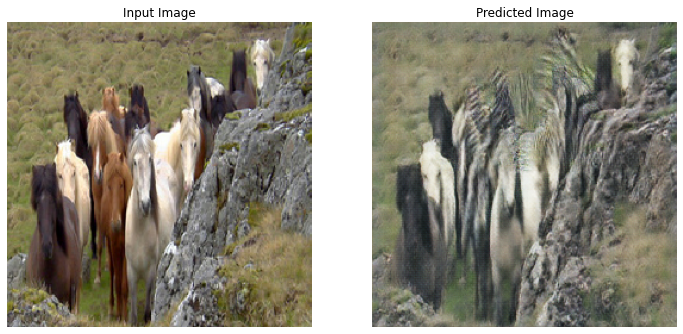

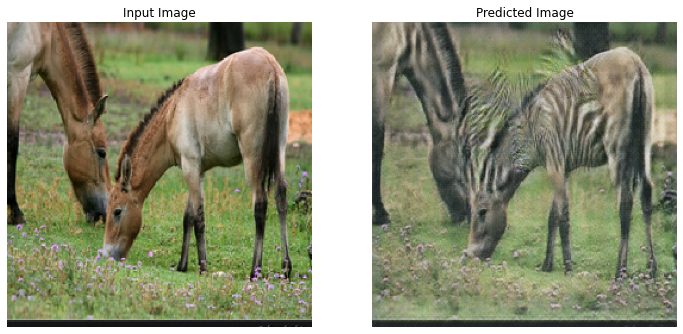

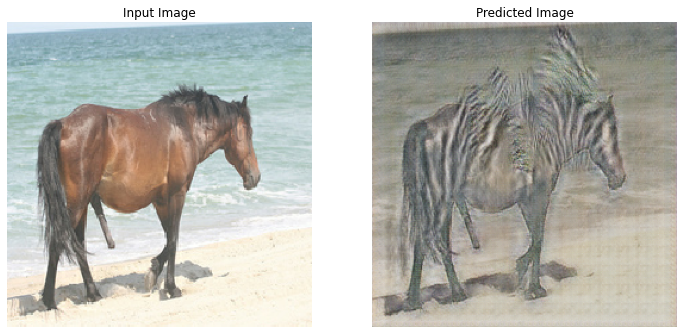

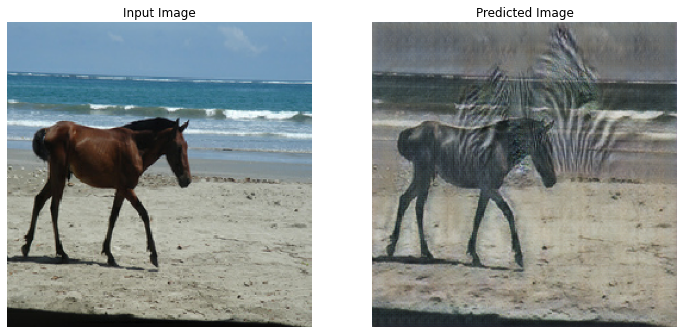

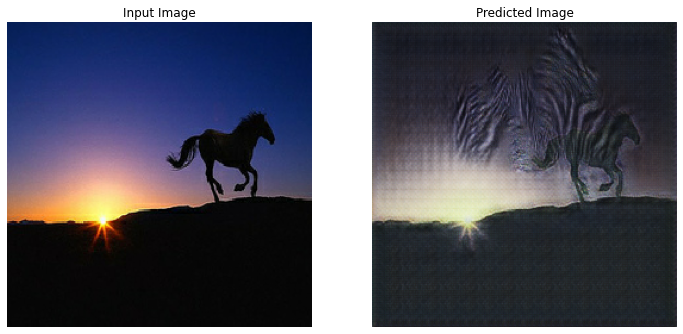

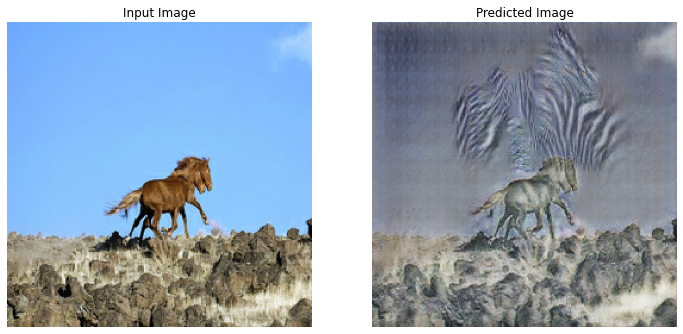

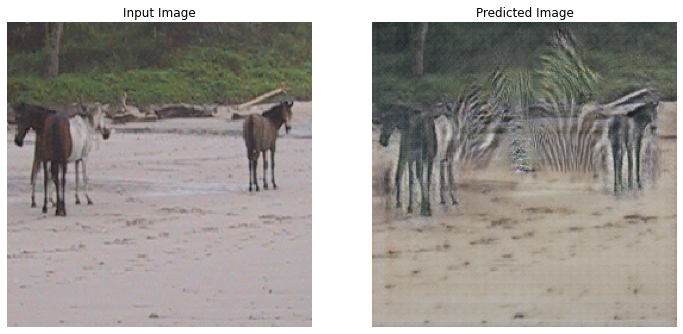

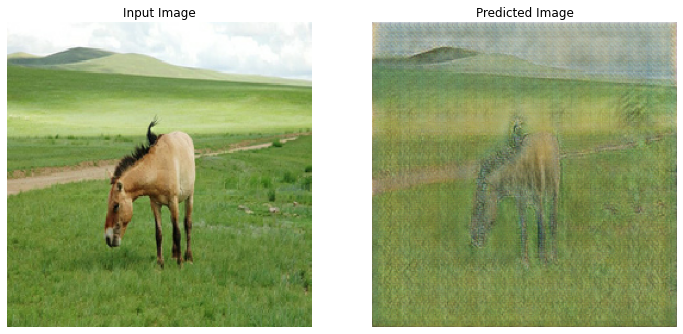

In [41]:
for inp in train_horses.take(10):
  generated_images(generator_g, inp)

### Generating images from the `test_set`

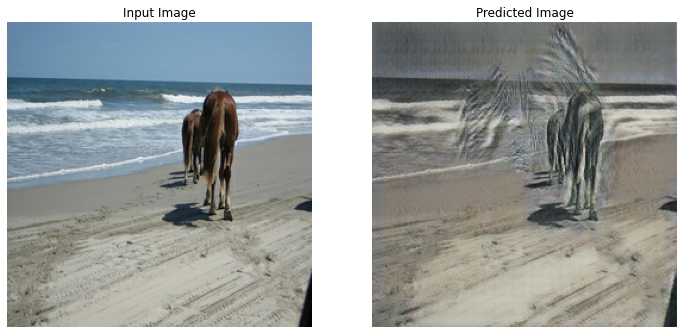

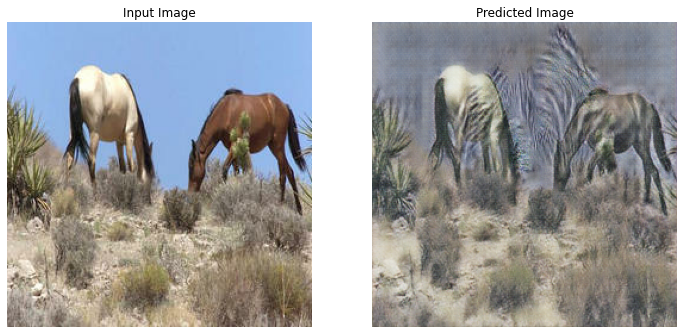

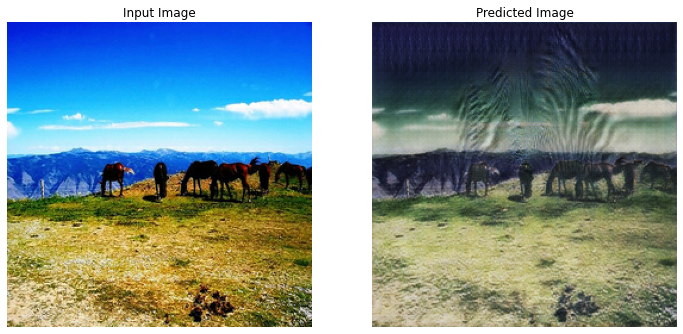

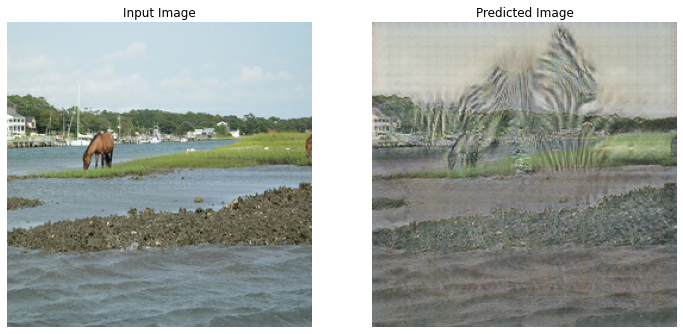

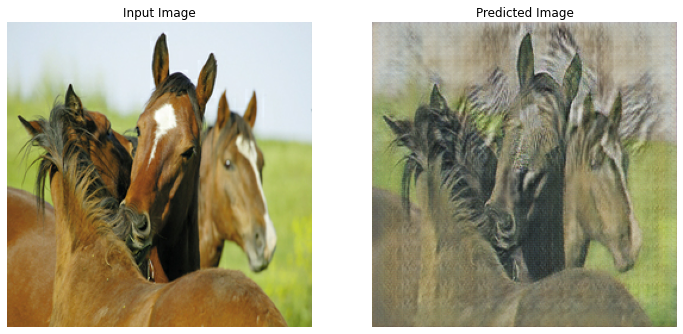

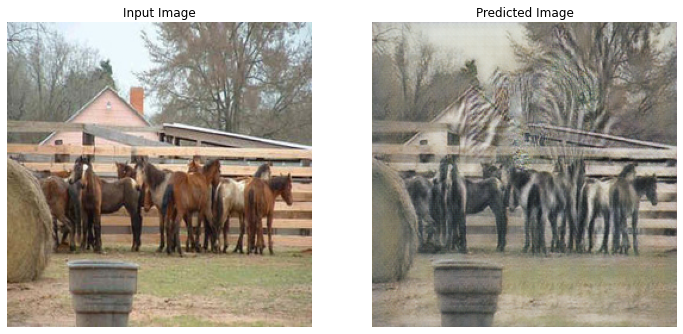

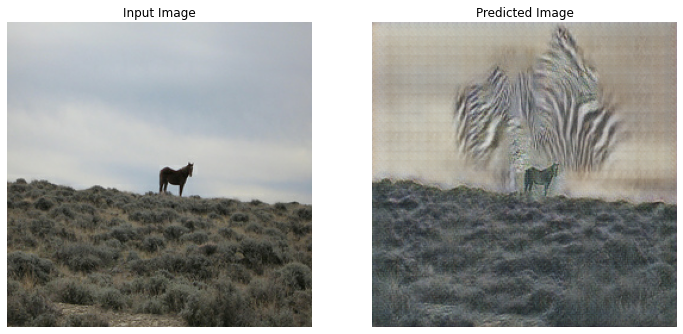

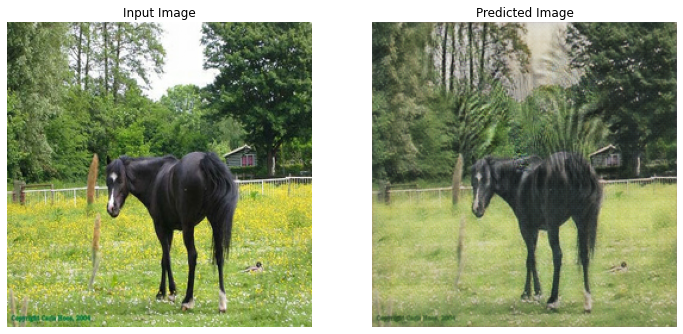

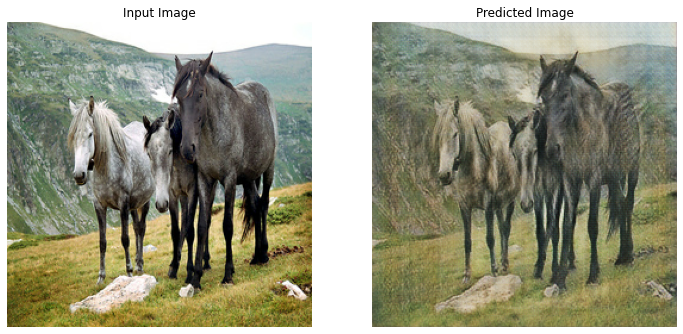

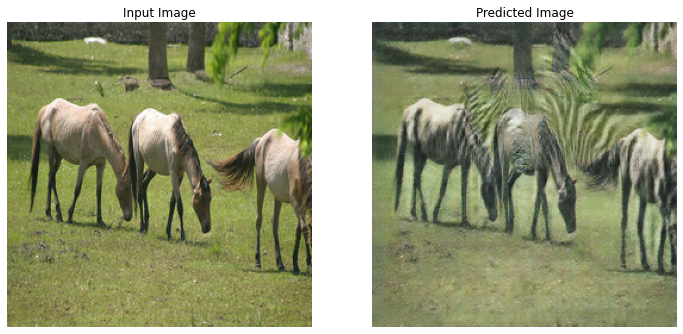

In [42]:
for inp in test_horses.take(10):
  generated_images(generator_g, inp)

### Conclusion.

Although the model didn't perform well we can see that there are some mapings from horse images to zebras images which the model have learned. To improve this model all we have to do is to train for more epochs.

### Resources Used.

* [pix2pix tensorflow](https://github.com/tensorflow/examples/blob/master/tensorflow_examples/models/pix2pix/pix2pix.py)